In the Hippocampus dataset, we use a Visium slice as the reference and integrate two Slide-SeqV2 slices with it via ARIEL, followed by a series of downstream analyses.

In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import math
import torch
import matplotlib.pyplot as plt
import scanpy as sc
import squidpy as sq
import anndata as ad
import pandas as pd
import anndata
from sklearn.cluster import KMeans
from ariel_srt.Landmark import normalization_spatial, Rasterization, alternative_landmark, screen_landmark
from ariel_srt.Alignment import rigid_alignment
from ariel_srt.Transfer import Appro_GP, Exact_GP

In [2]:
path = './data/hippo'

# ARIEL

In [3]:
data_slice1=sc.read_h5ad(f'{path}/data_slice1.h5ad')
data_slice2=sc.read_h5ad(f'{path}/data_slice2.h5ad')
data_slice3=sc.read_h5ad(f'{path}/data_slice3.h5ad')

In [4]:
embedding1=pd.read_csv(f'{path}/embedding1.csv')
embedding2=pd.read_csv(f'{path}/embedding2.csv')
embedding3=pd.read_csv(f'{path}/embedding3.csv')

In [5]:
data_slice1.obsm['embedding']=np.array(embedding1.T)
data_slice2.obsm['embedding']=np.array(embedding2.T)
data_slice3.obsm['embedding']=np.array(embedding3.T)

In [6]:
print(data_slice1)
print(data_slice2)
print(data_slice3)

AnnData object with n_obs × n_vars = 841 × 897
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca', 'spatial', 'embedding'
    varm: 'PCs'
    layers: 'counts'
AnnData object with n_obs × n_vars = 9343 × 897
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var

In [7]:
spatial1 = normalization_spatial(data_slice1.obsm['spatial'])

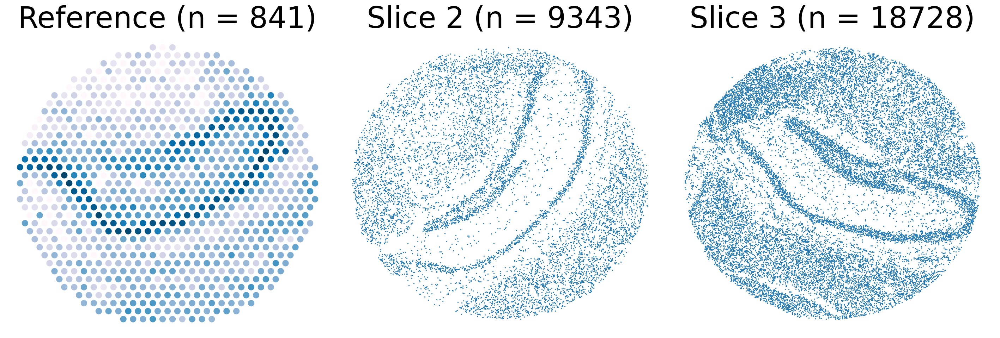

In [8]:
plt.figure(dpi=150,figsize=(19,6.5))
plt.subplot(1,3, 1)
plt.scatter(np.array(spatial1[:,0]),
            np.array(spatial1[:,1]),
            c=data_slice1.X[:,np.where(data_slice1.var_names=='Hpca')[0][0]],
            cmap='PuBu',
            s = 60)
plt.axis("off")
plt.title("Reference (n = 841)",fontsize=40)

plt.subplot(1,3, 2)
plt.scatter(np.array(data_slice2.obsm['spatial'][:,0]),
            np.array(data_slice2.obsm['spatial'][:,1]),
            s = 0.3,
            )
plt.axis("off")
plt.title("Slice 2 (n = 9343)",fontsize=40)

plt.subplot(1,3, 3)
plt.scatter(np.array(data_slice3.obsm['spatial'][:,0]),
            np.array(data_slice3.obsm['spatial'][:,1]),
            s = 0.3)
plt.axis("off")
plt.title("Slice 3 (n = 18728)",fontsize=40)

plt.tight_layout()

## slice2 to slice1

### Select landmarks

In [9]:
embedding1=data_slice1.obsm['embedding']
spatial_new2, embedding_new2=Rasterization(data_slice2.obsm['spatial'], data_slice2.obsm['embedding'],nx=40,ny=40)

In [10]:
lm1, lm2 = alternative_landmark(spatial1, spatial_new2, embedding1, embedding_new2)

In [11]:
lm1, lm2 = screen_landmark(lm1, lm2)

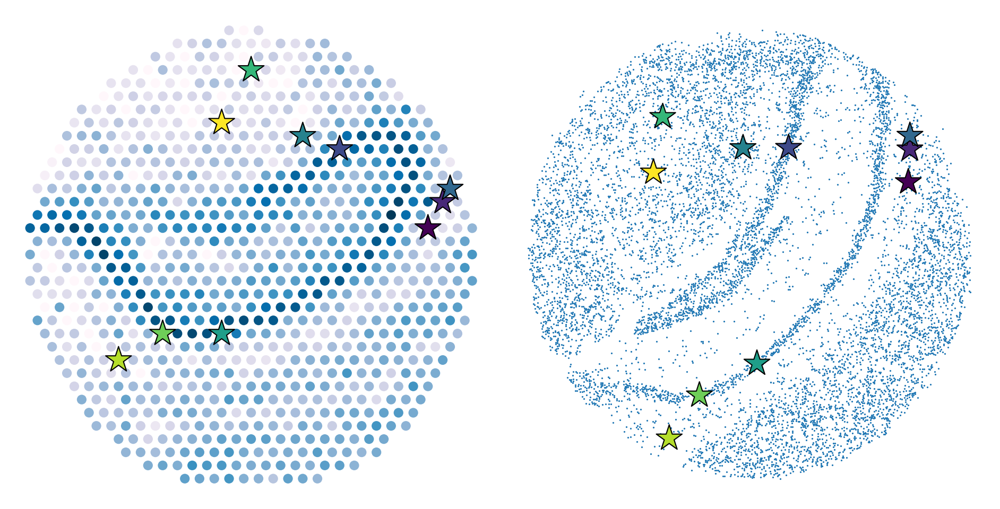

In [12]:
plt.figure(dpi=150,figsize=(19*2/3,6.5))
plt.subplot(1,2, 1)
plt.scatter(np.array(spatial1[:,0]),
            np.array(spatial1[:,1]),
            c=data_slice1.X[:,np.where(data_slice1.var_names=='Hpca')[0][0]],
            cmap='PuBu',
            s = 60)
plt.axis("off")
plt.scatter(lm1[:,0],lm1[:,1],s=600, c = range(lm1.shape[0]), marker = "*",edgecolor = "black")

plt.subplot(1,2, 2)
plt.scatter(np.array(data_slice2.obsm['spatial'][:,0]),
            np.array(data_slice2.obsm['spatial'][:,1]),
            s = 0.3)
plt.scatter(lm2[:,0],lm2[:,1],s=600, c = range(lm2.shape[0]), marker = "*",edgecolor = "black")
plt.axis("off")

plt.tight_layout()

### Alignment

In [13]:
lm2_tran, spatial2 = rigid_alignment(lm1, lm2, data_slice2.obsm['spatial'])

(0.012039083871013156,
 1.0624582145613837,
 0.013699886875654994,
 1.0982542940479958)

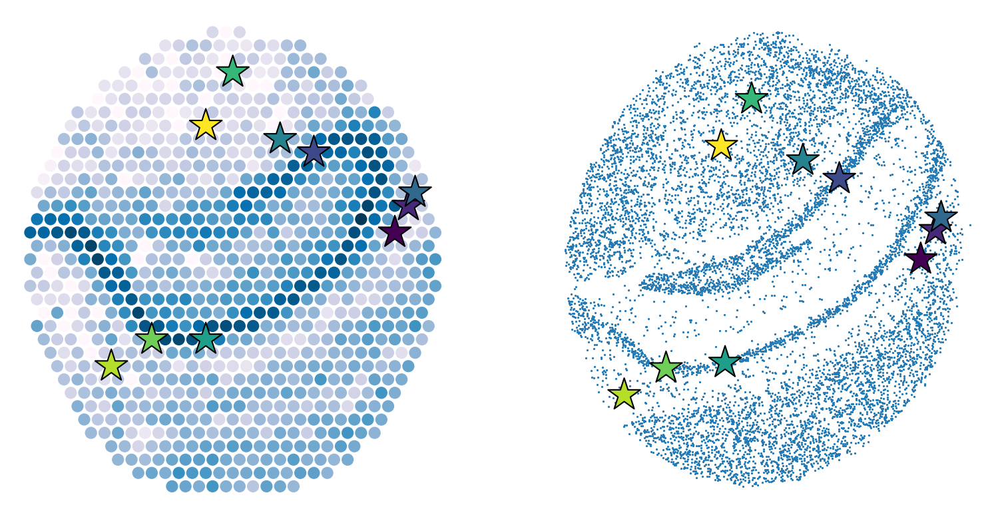

In [14]:
plt.figure(dpi=150,figsize=(19*2/3,6.5))

plt.subplot(1,2, 1)
plt.scatter(np.array(spatial1[:,0]),
            np.array(spatial1[:,1]),
            c=data_slice1.X[:,np.where(data_slice1.var_names=='Hpca')[0][0]],
            cmap='PuBu',
            s = 60)
plt.axis("off")
plt.scatter(lm1[:,0],lm1[:,1],s=600, c = range(lm1.shape[0]), marker = "*",edgecolor = "black")

plt.subplot(1,2, 2)
plt.scatter(spatial2[:,0],
            spatial2[:,1],
            s = 0.3)
plt.scatter(lm2_tran[:,0],lm2_tran[:,1],s=600, c = range(lm2_tran.shape[0]), marker = "*",edgecolor = "black")
plt.axis("off")

### Transfer

In [18]:
x1=np.array(spatial1)
x2=np.array(spatial2)

x1=torch.tensor(x1).float()
x2=torch.tensor(x2).float()

y2=data_slice2.obsm['X_pca']

y2=torch.tensor(y2).float()

In [19]:
prediction_pca = Appro_GP(x1, x2, y2)

E:\ProgramFiles\anaconda3\envs\py39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [20]:
predictions2_pca=prediction_pca.detach().numpy()
# Reconstruction
y_predict2_pca_all=np.dot(predictions2_pca,data_slice2.varm['PCs'].T)
# Save
pd.DataFrame(y_predict2_pca_all).to_csv(f'{path}/y_predict2_pca_all.csv',index=False)

In [15]:
y_predict2_pca_all=np.array(pd.read_csv(f'{path}/y_predict2_pca_all.csv',header=0))

In [16]:
n_x2=y_predict2_pca_all.copy()

for i in range(y_predict2_pca_all.shape[1]):
    n_x2[:,i]=n_x2[:,i]-min(n_x2[:,i])

## slice3 to data_slice1

### Select landmarks

In [17]:
spatial_new3, embedding_new3=Rasterization(data_slice3.obsm['spatial'], data_slice3.obsm['embedding'],nx=40,ny=40)
spatial1 = normalization_spatial(data_slice1.obsm['spatial'])
embedding1=data_slice1.obsm['embedding']

In [18]:
lm1, lm3 = alternative_landmark(spatial1, spatial_new3, embedding1, embedding_new3)

In [19]:
lm1, lm3 = screen_landmark(lm1, lm3)

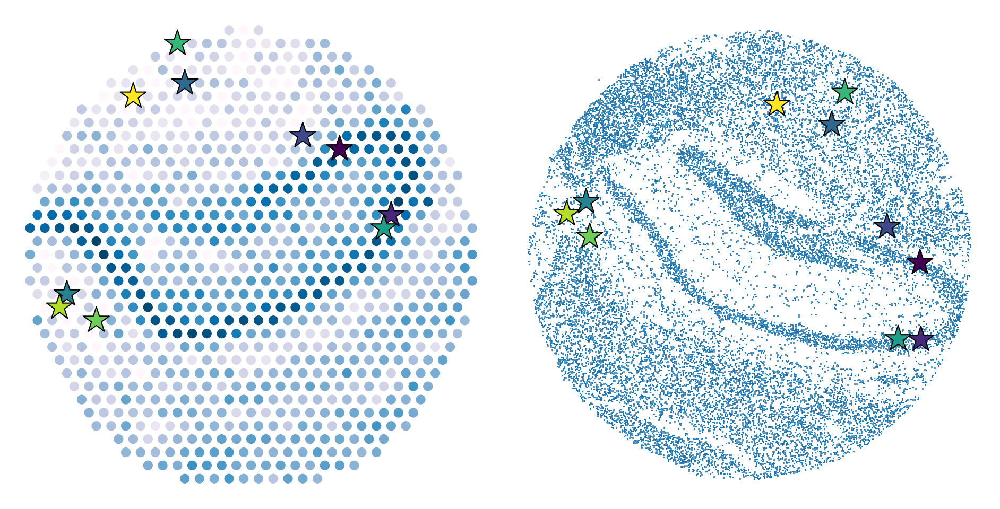

In [20]:
plt.figure(dpi=150,figsize=(19*2/3,6.5))
plt.subplot(1,2, 1)
plt.scatter(np.array(spatial1[:,0]),
            np.array(spatial1[:,1]),
            c=data_slice1.X[:,np.where(data_slice1.var_names=='Hpca')[0][0]],
            cmap='PuBu',
            s = 60)
plt.axis("off")
plt.scatter(lm1[:,0],lm1[:,1],s=600, c = range(lm1.shape[0]), marker = "*",edgecolor = "black")

plt.subplot(1,2, 2)
plt.scatter(np.array(data_slice3.obsm['spatial'][:,0]),
            np.array(data_slice3.obsm['spatial'][:,1]),
            s = 0.3)
plt.scatter(lm3[:,0],lm3[:,1],s=600, c = range(lm3.shape[0]), marker = "*",edgecolor = "black")
plt.axis("off")

plt.tight_layout()

### Alignment

In [21]:
lm3_tran, spatial3 = rigid_alignment(lm1, lm3, data_slice3.obsm['spatial'])

(-0.1333285089585814,
 0.9665616073575682,
 -0.03608955026941744,
 1.1028268131776562)

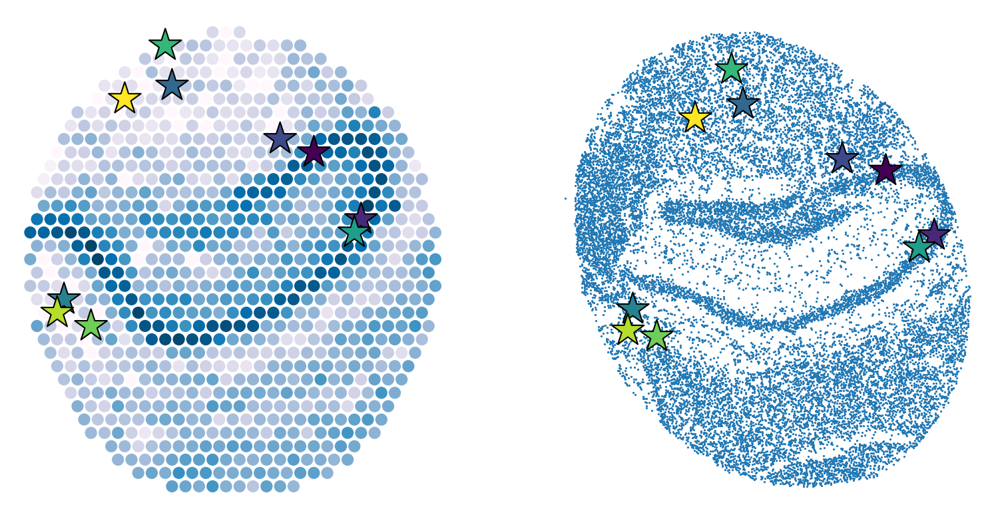

In [22]:
plt.figure(dpi=150,figsize=(19*2/3,6.5))

plt.subplot(1,2, 1)
plt.scatter(np.array(spatial1[:,0]),
            np.array(spatial1[:,1]),
            c=data_slice1.X[:,np.where(data_slice1.var_names=='Hpca')[0][0]],
            cmap='PuBu',
            s = 60)
plt.axis("off")
plt.scatter(lm1[:,0],lm1[:,1],s=600, c = range(lm1.shape[0]), marker = "*",edgecolor = "black")

plt.subplot(1,2, 2)
plt.scatter(spatial3[:,0],
            spatial3[:,1],
            s = 0.3)
plt.scatter(lm3_tran[:,0],lm3_tran[:,1],s=600, c = range(lm3_tran.shape[0]), marker = "*",edgecolor = "black")
plt.axis("off")

### Transfer

In [31]:
x1=np.array(spatial1)
x3=np.array(spatial3)

x1=torch.tensor(x1).float()
x3=torch.tensor(x3).float()

y3=data_slice3.obsm['X_pca']

y3=torch.tensor(y3).float()

In [32]:
prediction_pca = Appro_GP(x1, x3, y3)

E:\ProgramFiles\anaconda3\envs\py39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [33]:
prediction_pca=prediction_pca.detach().numpy()
y_predict3_pca_all=np.dot(prediction_pca,data_slice3.varm['PCs'].T)
pd.DataFrame(y_predict3_pca_all).to_csv(f'{path}/y_predict3_pca_all.csv',header=False, index=False)

In [23]:
y_predict3_pca_all=pd.read_csv(f'{path}/y_predict3_pca_all.csv',header=None)
y_predict3_pca_all=np.array(y_predict3_pca_all)

In [24]:
n_x3=y_predict3_pca_all.copy()

for i in range(y_predict3_pca_all.shape[1]):
    n_x3[:,i]=n_x3[:,i]-min(n_x3[:,i])

## GPR for reference

In [40]:
x1_1=np.array(spatial1)
x1=np.array(spatial1)

x1_1=torch.tensor(x1_1).float()
x1=torch.tensor(x1).float()

y1=data_slice1.obsm['X_pca']

y1=torch.tensor(y1).float()

In [41]:
prediction_pca = Exact_GP(x1, x1_1, y1, num_epochs = 1000, lr = 0.01)

E:\ProgramFiles\anaconda3\envs\py39\lib\site-packages\gpytorch\models\exact_gp.py:284: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


In [42]:
predictions1_pca=prediction_pca.numpy()
y_predict1_pca_all=np.dot(prediction_pca,data_slice1.varm['PCs'].T)
pd.DataFrame(y_predict1_pca_all).to_csv(f'{path}/y_predict1_pca_all.csv',index=False)

In [25]:
y_predict1_pca_all=np.array(pd.read_csv(f'{path}/y_predict1_pca_all.csv',header=0))

In [26]:
n_x1=y_predict1_pca_all.copy()
for i in range(y_predict1_pca_all.shape[1]):
    n_x1[:,i]=n_x1[:,i]-min(n_x1[:,i])

# Results and downstream works

## Alignment results

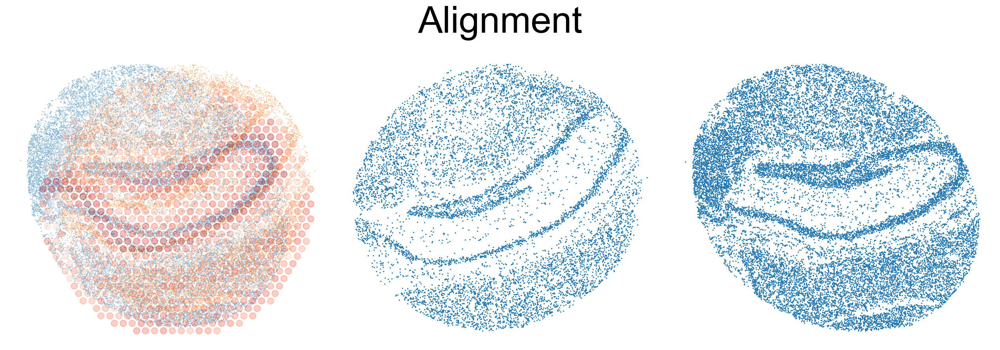

In [27]:
plt.figure(dpi=150,figsize=(17,6))

plt.subplot(1,3, 1)
plt.scatter(spatial3[:,0],
            spatial3[:,1],
            s=0.3,
            alpha = 0.33)
plt.scatter(spatial2[:,0],
            spatial2[:,1],
            s=0.3,
            alpha = 0.33)
plt.scatter(spatial1[:,0],
            spatial1[:,1],
            cmap='Reds',
            c=data_slice1.X[:,np.where(data_slice1.var_names=='Hpca')[0][0]],
            s = 60,
            alpha = 0.33)
plt.axis("off")

plt.subplot(1,3, 2)
plt.scatter(spatial2[:,0],
            spatial2[:,1],
            s=0.3)
plt.axis("off")

plt.subplot(1,3, 3)
plt.scatter(spatial3[:,0],
            spatial3[:,1],
            s=0.3)
plt.axis("off")
plt.suptitle('Alignment',font={'family':'Arial', 'size':45})
plt.tight_layout()

## Transfer results

In [28]:
n_x1_to01=n_x1.copy()
n_x2_to01=n_x2.copy()
n_x3_to01=n_x3.copy()
for i in range(n_x1.shape[0]):
    for j in range(n_x1.shape[1]):
        n_x1_to01[i,j]=(n_x1[i,j]-np.min(n_x1[:,j]))/(np.max(n_x1[:,j])-np.min(n_x1[:,j]))
        n_x2_to01[i,j]=(n_x2[i,j]-np.min(n_x2[:,j]))/(np.max(n_x2[:,j])-np.min(n_x2[:,j]))
        n_x3_to01[i,j]=(n_x3[i,j]-np.min(n_x3[:,j]))/(np.max(n_x3[:,j])-np.min(n_x3[:,j]))

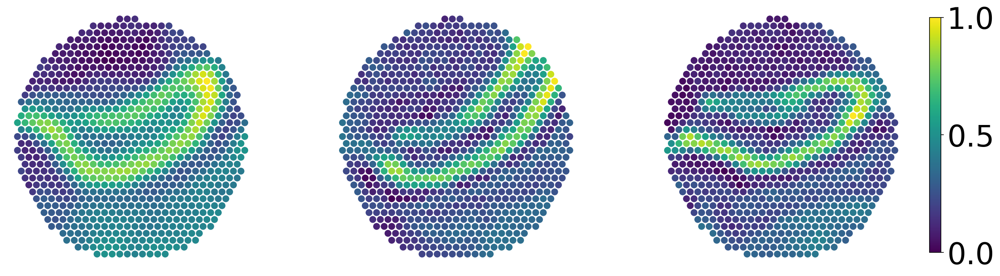

In [29]:
plt.figure(dpi=150, figsize=(19, 5.5))

plt.subplot(1, 3, 1)
scatter1 = plt.scatter(spatial1[:, 0], spatial1[:, 1], 
                     c=n_x1_to01[:, np.where(data_slice1.var_names == 'Hpca')[0][0]],
                     s=50)
plt.axis("off")

plt.subplot(1, 3, 2)
scatter2 = plt.scatter(spatial1[:, 0], spatial1[:, 1], 
                     c=n_x2_to01[:, np.where(data_slice2.var_names == 'Hpca')[0][0]],
                     s=50)
plt.axis("off")

plt.subplot(1, 3, 3)
scatter3 = plt.scatter(spatial1[:, 0], spatial1[:, 1], 
                     c=n_x3_to01[:, np.where(data_slice3.var_names == 'Hpca')[0][0]],
                     s=50)
plt.axis("off")

cax = plt.axes([0.92, 0.15, 0.01, 0.7])
cbar = plt.colorbar(scatter1, cax=cax)
cbar.ax.tick_params(labelsize=35)
plt.subplots_adjust(wspace=0.3)

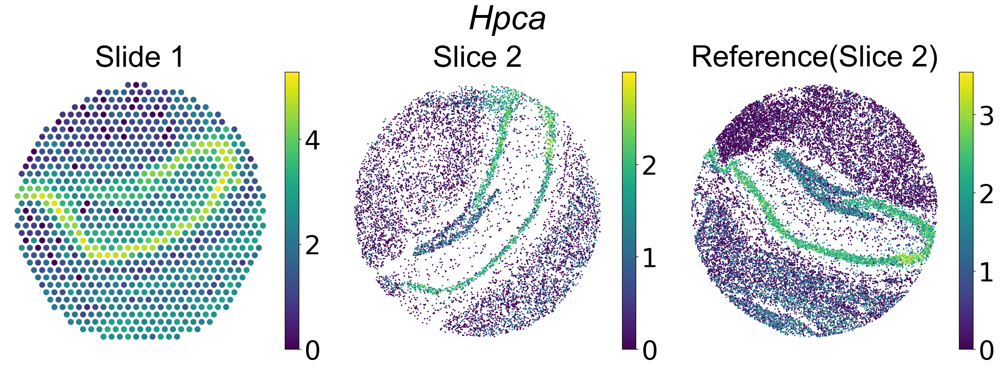

In [30]:
plt.figure(dpi=150,figsize=(19,7))
plt.subplot(1,3, 1)
plt.scatter(np.array(data_slice1.obsm['spatial'][:,0]),
            np.array(data_slice1.obsm['spatial'][:,1]),
            c=data_slice1.X[:,np.where(data_slice1.var_names=='Hpca')[0][0]],
            s = 50)
plt.axis("off")
cbar = plt.colorbar(pad=0.03)
cbar.ax.tick_params(labelsize=35)
plt.title("Slide 1",font={'family':'Arial', 'size':40})

plt.subplot(1,3,2)
plt.scatter(np.array(data_slice2.obsm['spatial'][:,0]),
            np.array(data_slice2.obsm['spatial'][:,1]),
            c=data_slice2.X[:,np.where(data_slice2.var_names=='Hpca')[0][0]],
            s = 1)
plt.axis("off")
cbar = plt.colorbar(pad=0.03)
cbar.ax.tick_params(labelsize=35)
plt.title("Slice 2",font={'family':'Arial', 'size':40})

plt.subplot(1,3,3)
plt.scatter(np.array(data_slice3.obsm['spatial'][:,0]),
            np.array(data_slice3.obsm['spatial'][:,1]),
            c=data_slice3.X[:,np.where(data_slice3.var_names=='Hpca')[0][0]],
            s = 1)
plt.axis("off")
cbar = plt.colorbar(pad=0.03)
cbar.ax.tick_params(labelsize=35)
plt.title("Reference(Slice 2)",font={'family':'Arial', 'size':40})

plt.suptitle('Hpca',font={'family':'Arial', 'size':45, 'style':'italic'})
plt.subplots_adjust(top=0.8)

plt.tight_layout()

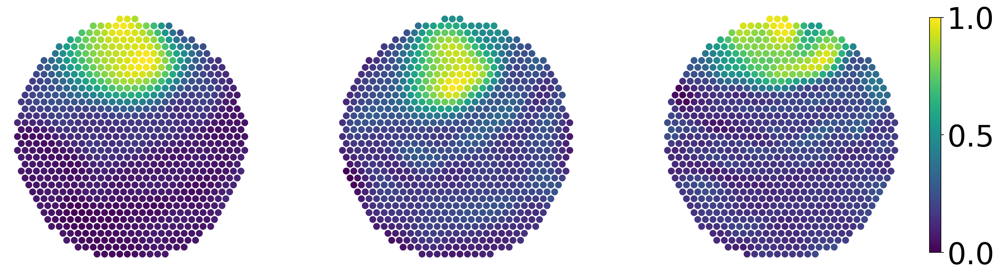

In [31]:
plt.figure(dpi=150, figsize=(19, 5.5))

plt.subplot(1, 3, 1)
scatter1 = plt.scatter(spatial1[:, 0], spatial1[:, 1],
                     c=n_x1_to01[:, np.where(data_slice1.var_names == 'Prkcd')[0][0]],
                     s=50)
plt.axis("off")

plt.subplot(1, 3, 2)
scatter2 = plt.scatter(spatial1[:, 0], spatial1[:, 1], 
                     c=n_x2_to01[:, np.where(data_slice2.var_names == 'Prkcd')[0][0]],
                     s=50)
plt.axis("off")

plt.subplot(1, 3, 3)
scatter3 = plt.scatter(spatial1[:, 0], spatial1[:, 1], 
                     c=n_x3_to01[:, np.where(data_slice3.var_names == 'Prkcd')[0][0]],
                     s=50)
plt.axis("off")

cax = plt.axes([0.92, 0.15, 0.01, 0.7])
cbar = plt.colorbar(scatter1, cax=cax)
cbar.ax.tick_params(labelsize=35)
plt.subplots_adjust(wspace=0.3)

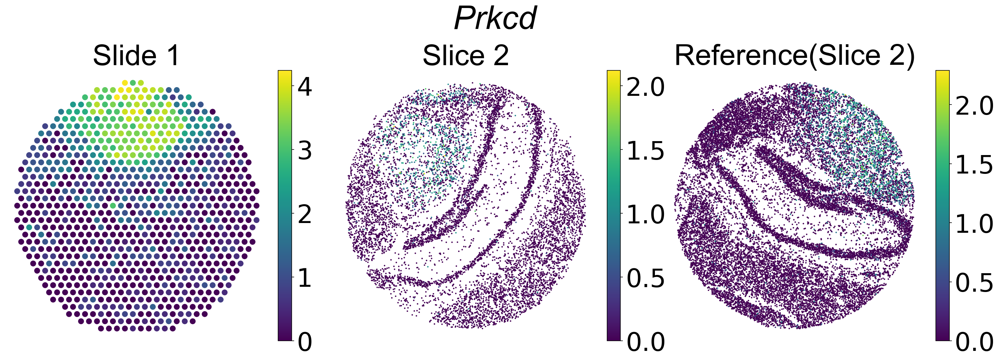

In [32]:
plt.figure(dpi=150,figsize=(19,7))
plt.subplot(1,3, 1)
plt.scatter(np.array(data_slice1.obsm['spatial'][:,0]),
            np.array(data_slice1.obsm['spatial'][:,1]),
            c=data_slice1.X[:,np.where(data_slice1.var_names=='Prkcd')[0][0]],
            s = 50)
plt.axis("off")
cbar = plt.colorbar(pad=0.03)
cbar.ax.tick_params(labelsize=35)
plt.title("Slide 1",font={'family':'Arial', 'size':40})

plt.subplot(1,3,2)
plt.scatter(np.array(data_slice2.obsm['spatial'][:,0]),
            np.array(data_slice2.obsm['spatial'][:,1]),
            c=data_slice2.X[:,np.where(data_slice2.var_names=='Prkcd')[0][0]],
            s = 1)
plt.axis("off")
cbar = plt.colorbar(pad=0.03)
cbar.ax.tick_params(labelsize=35)
plt.title("Slice 2",font={'family':'Arial', 'size':40})

plt.subplot(1,3,3)
plt.scatter(np.array(data_slice3.obsm['spatial'][:,0]),
            np.array(data_slice3.obsm['spatial'][:,1]),
            c=data_slice3.X[:,np.where(data_slice3.var_names=='Prkcd')[0][0]],
            s = 1)
plt.axis("off")
cbar = plt.colorbar(pad=0.03)
cbar.ax.tick_params(labelsize=35)
plt.title("Reference(Slice 2)",font={'family':'Arial', 'size':40})

plt.suptitle('Prkcd',font={'family':'Arial', 'size':45, 'style':'italic'})
plt.subplots_adjust(top=0.8)

plt.tight_layout()

## Spatial composite expression profiles 

In [33]:
average=(n_x1_to01+n_x2_to01+n_x3_to01)/3

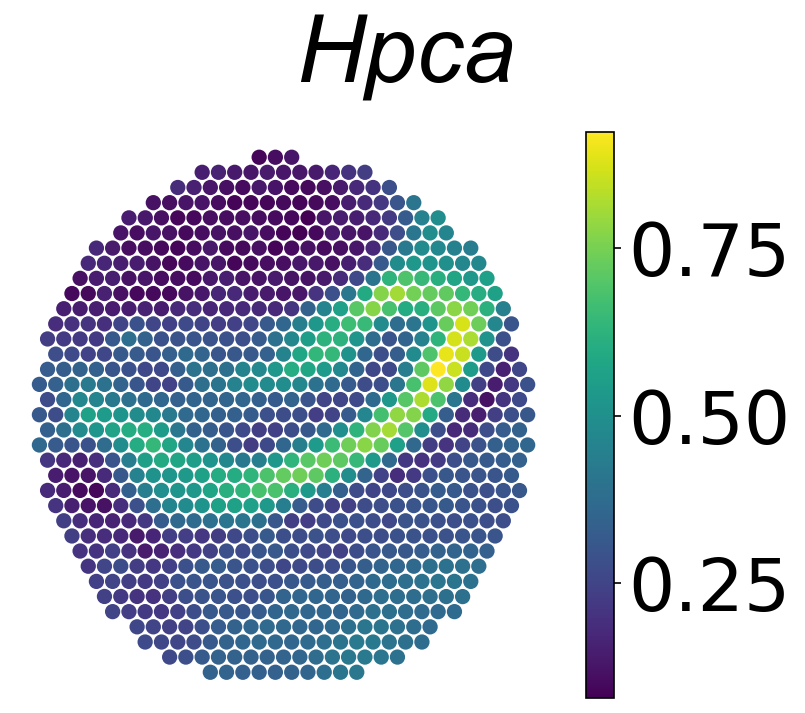

In [40]:
plt.figure(dpi=150,figsize=(5.5, 4.8) )
plt.scatter(spatial1[:,0],
            spatial1[:,1],
            c=average[:,np.where(data_slice3.var_names=='Hpca')[0][0]],
            s = 40)
plt.axis("off")
plt.colorbar().ax.tick_params(labelsize=35)
plt.suptitle('Hpca',font={'family':'Arial', 'size':45, 'style':'italic'})
plt.tight_layout()

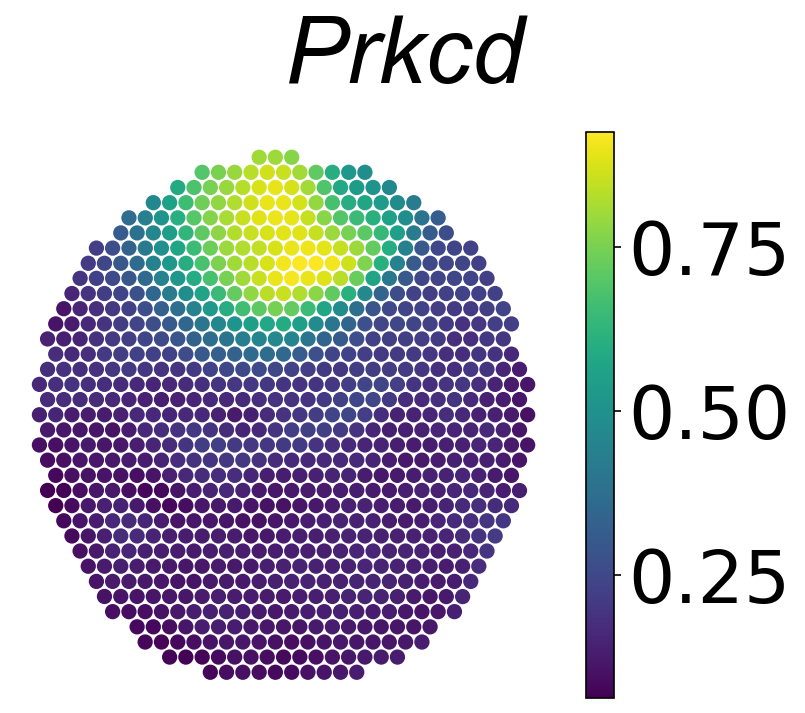

In [41]:
plt.figure(dpi=150,figsize=(5.5, 4.8) )
plt.scatter(spatial1[:,0],
            spatial1[:,1],
            c=average[:,np.where(data_slice3.var_names=='Prkcd')[0][0]],
            s = 40)
plt.axis("off")
plt.colorbar().ax.tick_params(labelsize=35)
plt.suptitle('Prkcd',font={'family':'Arial', 'size':45, 'style':'italic'})
plt.tight_layout()

## Clustering

E:\ProgramFiles\anaconda3\envs\py39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
E:\ProgramFiles\anaconda3\envs\py39\lib\site-packages\sklearn\cluster\_kmeans.py:1440: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


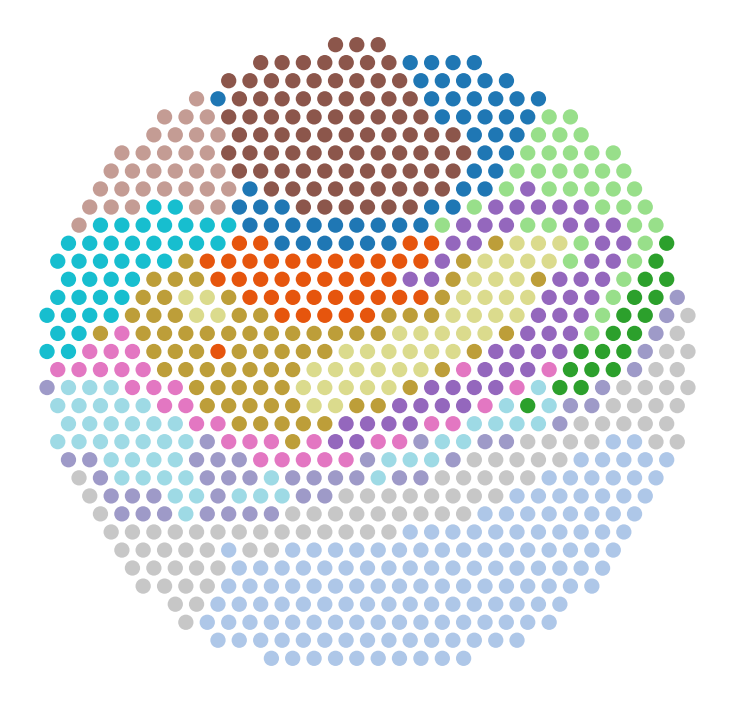

In [35]:
color = plt.cm.tab20(np.linspace(0, 1, 15))
color[2] = plt.cm.tab20b(9)
color[10] = plt.cm.tab20c(4)
color[5] = plt.cm.tab20c(13)
plt.figure(dpi=150,figsize=(5, 4.8) )
A = KMeans(n_clusters=15, random_state=9).fit_predict(average)
point_colors = []
for i in A:
    point_colors.append(color[i,:])
plt.scatter(spatial1[:,0],
            spatial1[:,1],
            c=point_colors,
            s = 40)
plt.axis("off")
plt.tight_layout()